In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf

from keras import optimizers, callbacks
from keras.utils import load_img, img_to_array

from sklearn.model_selection import train_test_split

from model.model import base_model, inc_model
from extras.utils import show_predictions, plot_history

physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    pass

In [2]:
path = "./data/CALTECH101_STOP_SIGN/stop_sign/"
ann_path = './data/CALTECH101_STOP_SIGN/stop_sign_annotations_converted.txt'
rows = open(ann_path).read().strip().split("\n")

In [3]:
data = []
target = []
file_names = []

In [4]:
for idx, row in enumerate(rows):

    # break the row to the file_name
    # and coordinates of bounding box
    row = row.split(",")

    file_name = row[0]
    file_name = file_name.split(".")[0]
    file_name = file_name.split("_")[1]
    file_name = "image_" + file_name + ".jpg"

    coords = row[1]
    coords = coords.split(" ")

    # we have unusual last line,
    # so there will be an if-else

    if idx != 63:
        coords = coords[1:-1]
    else:
        coords = coords[1:]

    # convert to int
    coords = [int(c) for c in coords]

    # read image
    full_path = path + file_name
    img = cv2.imread(full_path)
    (h, w) = img.shape[:2]

    # scale the bounding box coordinates
    # relative to the dimensions of the img
    Xmin = float(coords[0]) / w
    Ymin = float(coords[1]) / h
    Xmax = float(coords[2]) / w
    Ymax = float(coords[3]) / h

    # load the image again with
    # tensorflow and preprocess it
    img = load_img(full_path, target_size=(224, 224))
    img = img_to_array(img)

    data.append(img)
    target.append((Xmin, Ymin, Xmax, Ymax))
    file_names.append(file_name)

In [5]:
# normalize data, scaling from [0, 255] to [0, 1]
data = np.array(data, dtype="float32") / 255.0

target = np.array(target, dtype="float32")

In [6]:
data.shape

(64, 224, 224, 3)

In [7]:
split = train_test_split(data, target, file_names, test_size=0.1, random_state=31)

In [8]:
(train_imgs, test_imgs) = split[:2]
(train_target, test_target) = split[2:4]
(train_filenames, test_filenames) = split[4:]

In [9]:
f = open("test_images.txt", "w")
f.write("\n".join(test_filenames))
f.close()

In [10]:
LR = 1e-4
EPOCHS = 350
BATCH_SIZE = 32

In [11]:
es = callbacks.EarlyStopping(patience=50, verbose=1, restore_best_weights=True)

In [12]:
model = inc_model()

model.compile(loss='mse', optimizer=optimizers.Adam(learning_rate=LR))

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [13]:
H = model.fit(train_imgs,
              train_target,
              validation_data=(test_imgs, test_target),
              batch_size=BATCH_SIZE,
              epochs=EPOCHS,
              verbose=1,
              callbacks=[es])

Epoch 1/350
2/2 [==============================] - 9s 3s/step - loss: 0.2472 - val_loss: 0.3220
Epoch 2/350
2/2 [==============================] - 0s 286ms/step - loss: 0.1854 - val_loss: 0.2864
Epoch 3/350
2/2 [==============================] - 0s 281ms/step - loss: 0.1581 - val_loss: 0.2584
Epoch 4/350
2/2 [==============================] - 0s 283ms/step - loss: 0.1374 - val_loss: 0.2387
Epoch 5/350
2/2 [==============================] - 0s 282ms/step - loss: 0.1176 - val_loss: 0.2239
Epoch 6/350
2/2 [==============================] - 0s 287ms/step - loss: 0.1069 - val_loss: 0.2039
Epoch 7/350
2/2 [==============================] - 0s 283ms/step - loss: 0.0952 - val_loss: 0.1851
Epoch 8/350
2/2 [==============================] - 0s 278ms/step - loss: 0.0843 - val_loss: 0.1721
Epoch 9/350
2/2 [==============================] - 0s 284ms/step - loss: 0.0767 - val_loss: 0.1621
Epoch 10/350
2/2 [==============================] - 0s 283ms/step - loss: 0.0714 - val_loss: 0.1554
Epoch 11/350

In [14]:
model_1 = base_model()

model_1.compile(loss='mse', optimizer=optimizers.Adam(learning_rate=LR))

model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_94 (Conv2D)          (None, 224, 224, 32)      2432      
                                                                 
 conv2d_95 (Conv2D)          (None, 224, 224, 32)      25632     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 112, 112, 32)     0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0         
                                                                 
 conv2d_96 (Conv2D)          (None, 110, 110, 64)      18496     
                                                           

In [15]:
H1 = model_1.fit(train_imgs,
              train_target,
              validation_data=(test_imgs, test_target),
              batch_size=BATCH_SIZE,
              epochs=EPOCHS,
              verbose=1,
              callbacks=[es])

Epoch 1/350
2/2 [==============================] - 6s 2s/step - loss: 0.0946 - val_loss: 0.0054
Epoch 2/350
2/2 [==============================] - 0s 281ms/step - loss: 0.0377 - val_loss: 0.0051
Epoch 3/350
2/2 [==============================] - 0s 303ms/step - loss: 0.0398 - val_loss: 0.0046
Epoch 4/350
2/2 [==============================] - 0s 292ms/step - loss: 0.0374 - val_loss: 0.0044
Epoch 5/350
2/2 [==============================] - 0s 173ms/step - loss: 0.0392 - val_loss: 0.0048
Epoch 6/350
2/2 [==============================] - 0s 174ms/step - loss: 0.0354 - val_loss: 0.0045
Epoch 7/350
2/2 [==============================] - 0s 173ms/step - loss: 0.0347 - val_loss: 0.0049
Epoch 8/350
2/2 [==============================] - 0s 179ms/step - loss: 0.0274 - val_loss: 0.0104
Epoch 9/350
2/2 [==============================] - 0s 171ms/step - loss: 0.0232 - val_loss: 0.0251
Epoch 10/350
2/2 [==============================] - 0s 172ms/step - loss: 0.0209 - val_loss: 0.0313
Epoch 11/350

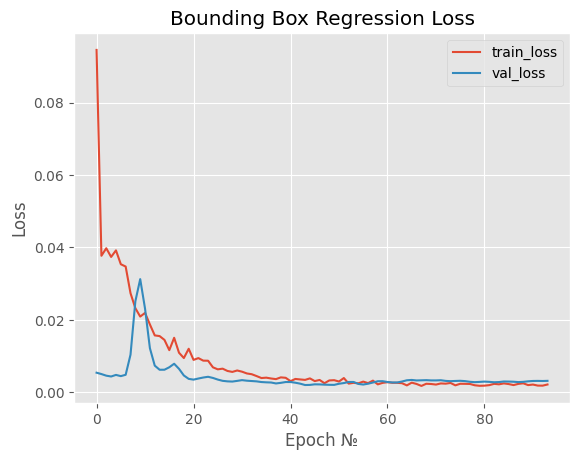

In [16]:
plot_history(H1)

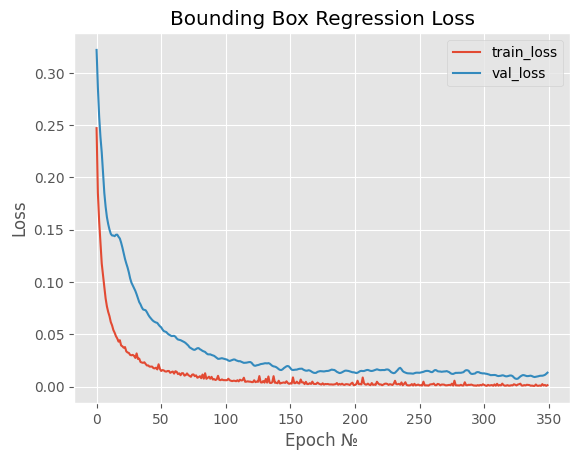

In [17]:
plot_history(H)

In [18]:
img_paths = []
for f in file_names:
    p = os.path.sep.join([path, f])
    img_paths.append(p)

1/1 [==============================] - 0s 256ms/step


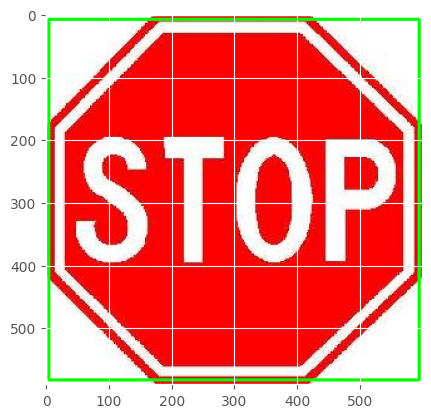

1/1 [==============================] - 0s 19ms/step


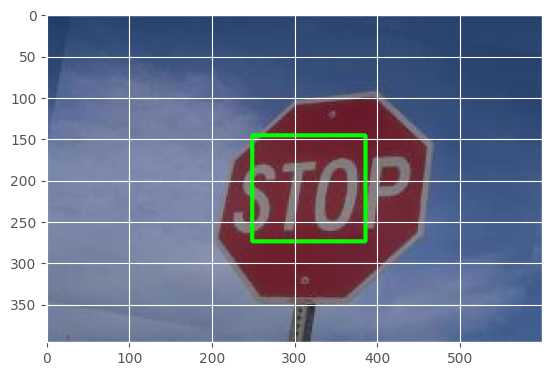

1/1 [==============================] - 0s 21ms/step


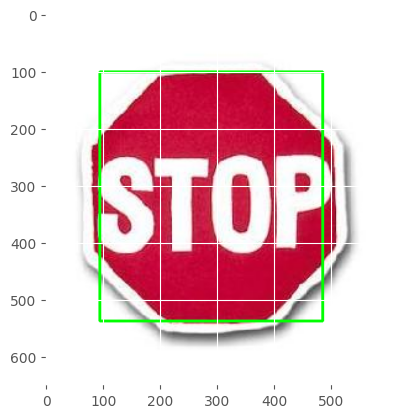

1/1 [==============================] - 0s 22ms/step


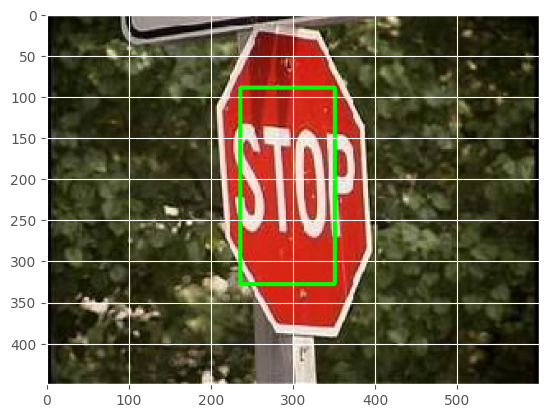

1/1 [==============================] - 0s 24ms/step


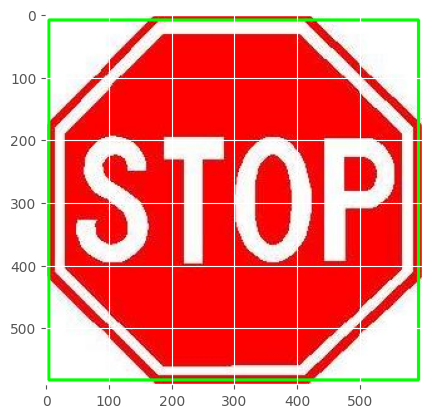

1/1 [==============================] - 0s 23ms/step


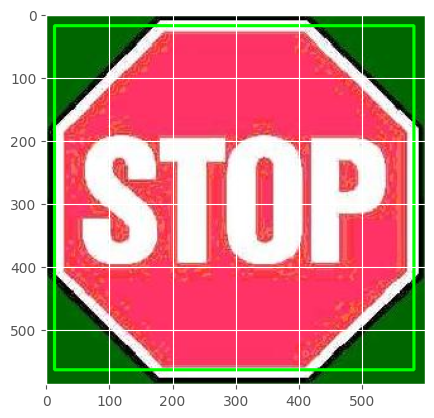

1/1 [==============================] - 0s 18ms/step


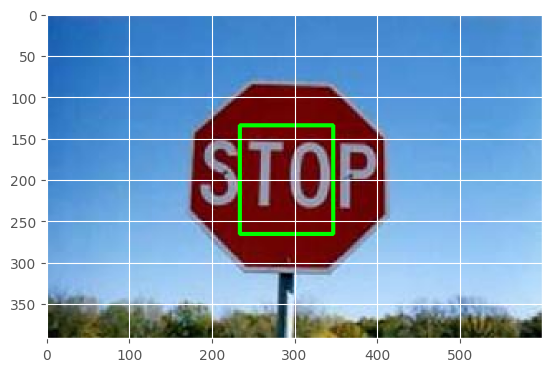

1/1 [==============================] - 0s 20ms/step


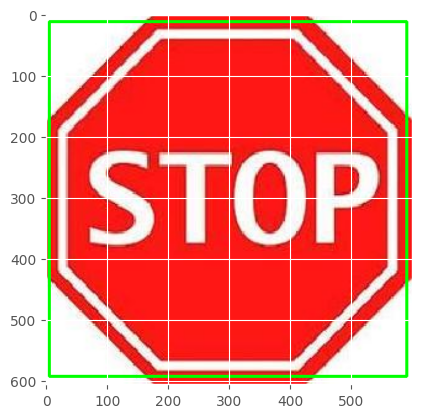

1/1 [==============================] - 0s 19ms/step


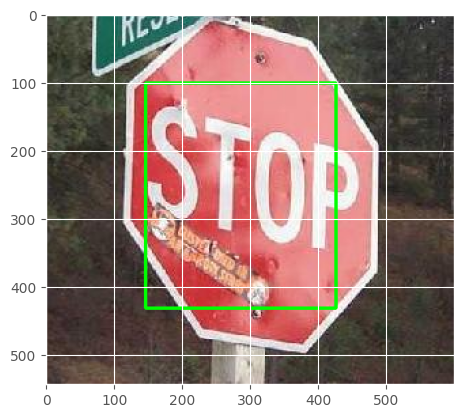

1/1 [==============================] - 0s 19ms/step


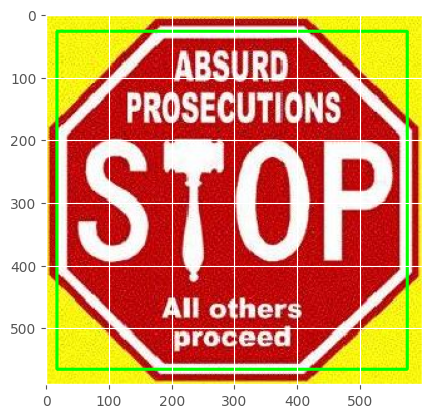

1/1 [==============================] - 0s 21ms/step


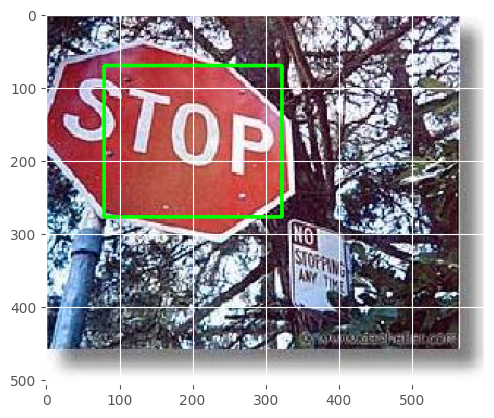

1/1 [==============================] - 0s 17ms/step


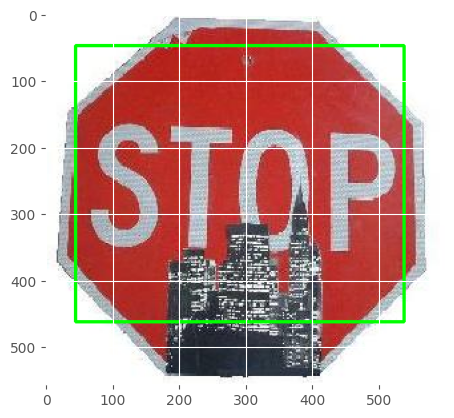

1/1 [==============================] - 0s 19ms/step


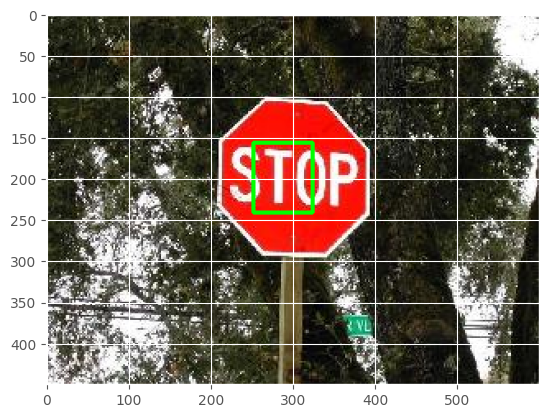

1/1 [==============================] - 0s 19ms/step


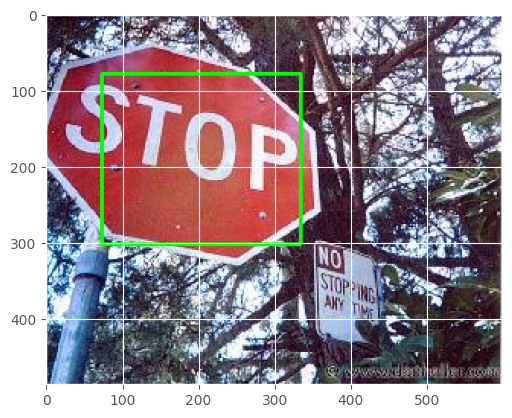

1/1 [==============================] - 0s 23ms/step


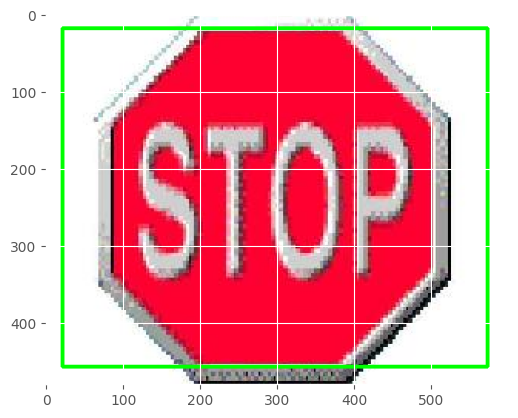

1/1 [==============================] - 0s 20ms/step


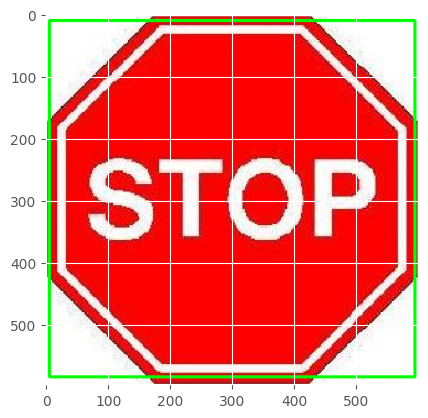

1/1 [==============================] - 0s 19ms/step


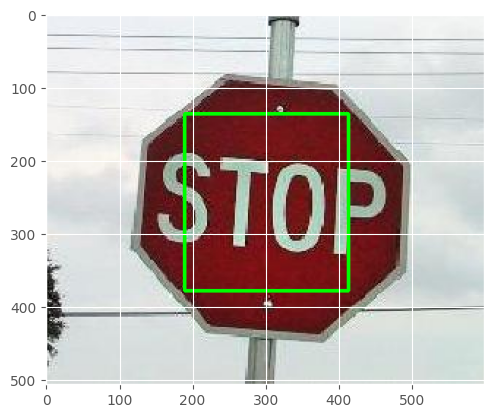

1/1 [==============================] - 0s 18ms/step


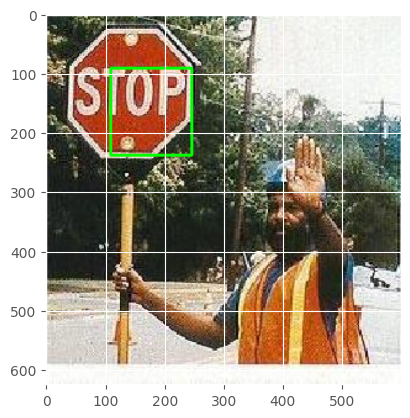

1/1 [==============================] - 0s 17ms/step


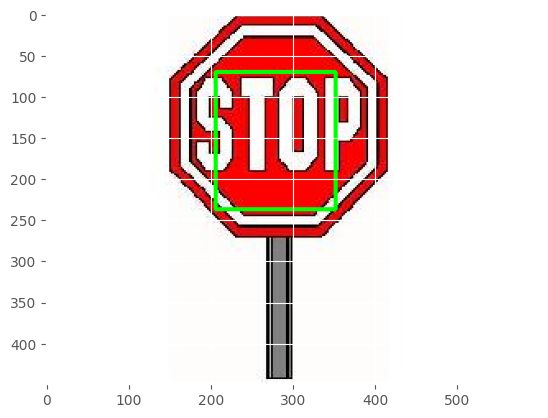

1/1 [==============================] - 0s 18ms/step


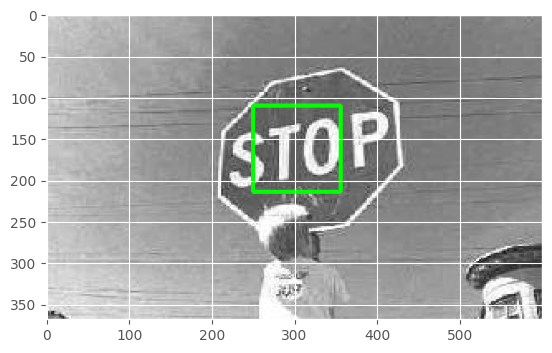

1/1 [==============================] - 0s 18ms/step


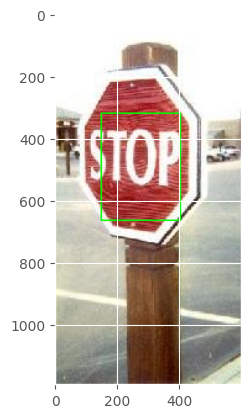

1/1 [==============================] - 0s 22ms/step


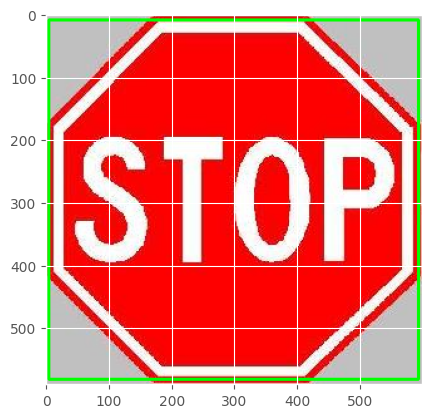

1/1 [==============================] - 0s 19ms/step


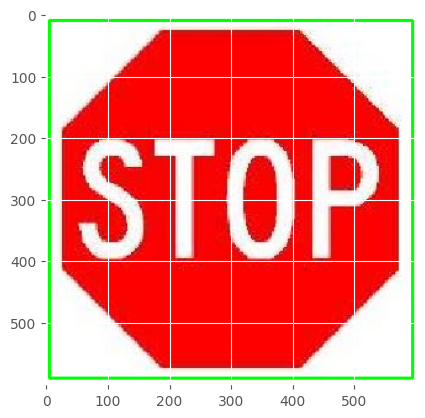

1/1 [==============================] - 0s 19ms/step


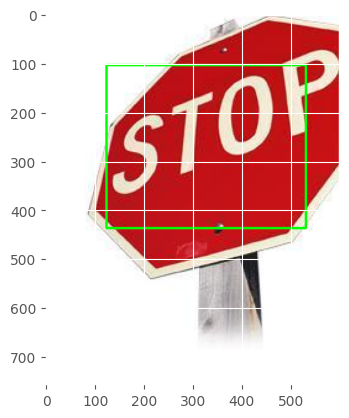

1/1 [==============================] - 0s 22ms/step


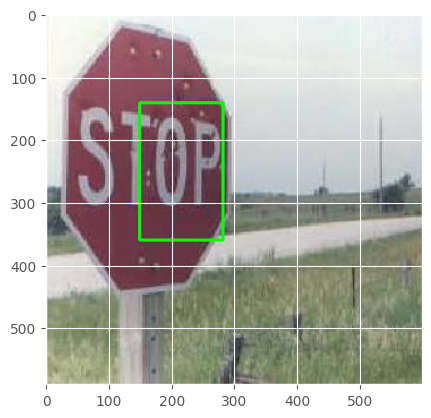

1/1 [==============================] - 0s 19ms/step


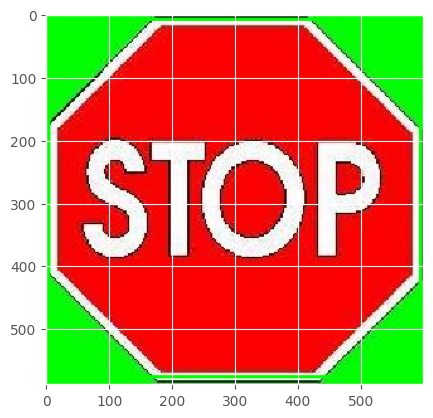

1/1 [==============================] - 0s 23ms/step


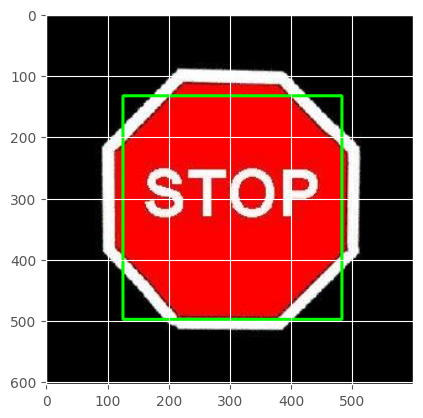

1/1 [==============================] - 0s 20ms/step


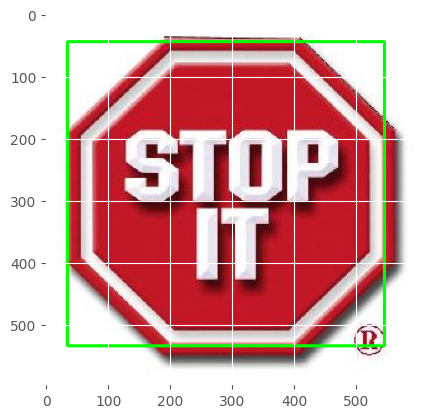

1/1 [==============================] - 0s 18ms/step


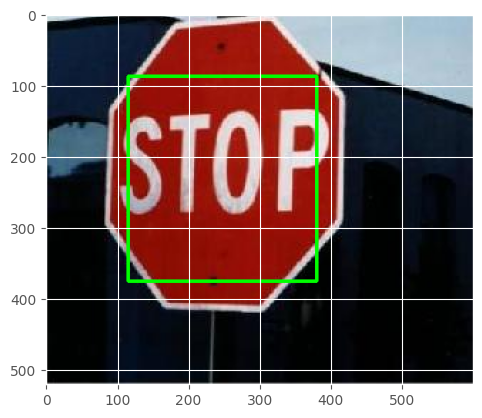

1/1 [==============================] - 0s 19ms/step


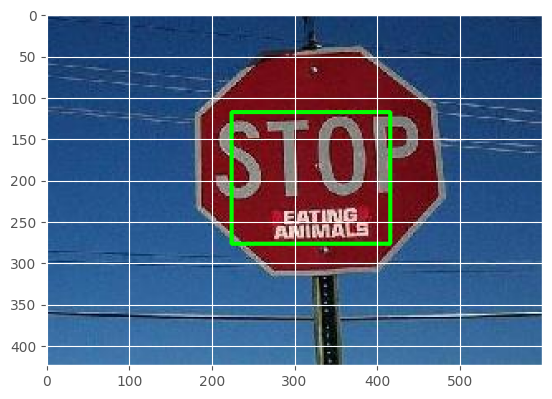

1/1 [==============================] - 0s 20ms/step


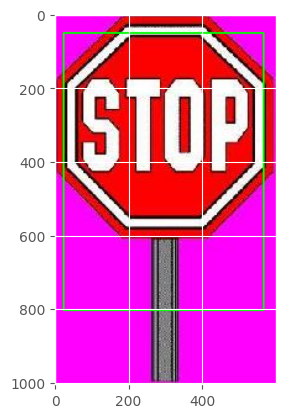

1/1 [==============================] - 0s 19ms/step


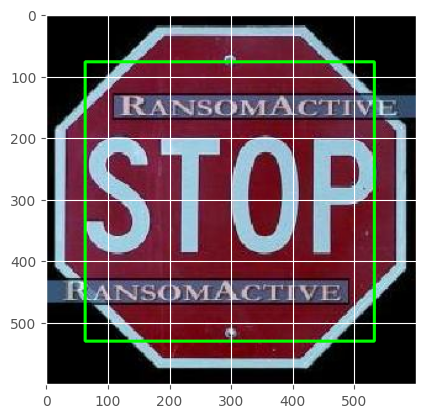

1/1 [==============================] - 0s 19ms/step


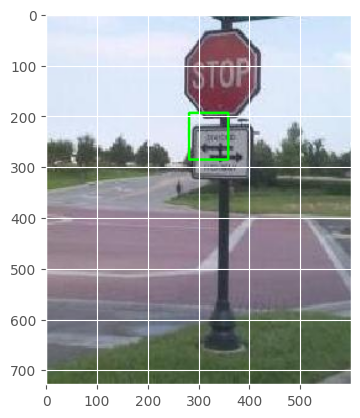

1/1 [==============================] - 0s 20ms/step


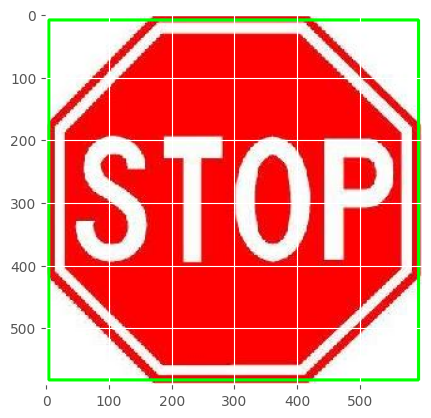

1/1 [==============================] - 0s 18ms/step


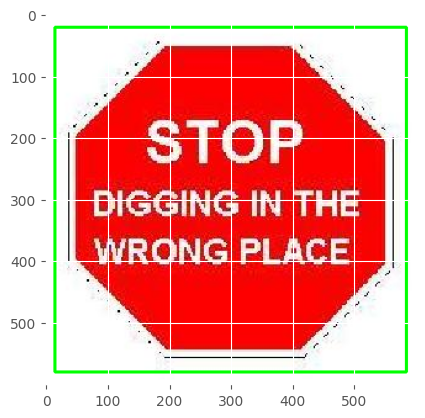

1/1 [==============================] - 0s 19ms/step


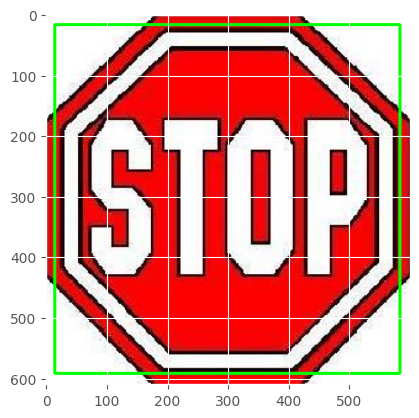

1/1 [==============================] - 0s 21ms/step


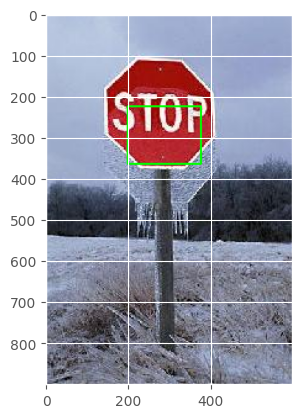

1/1 [==============================] - 0s 18ms/step


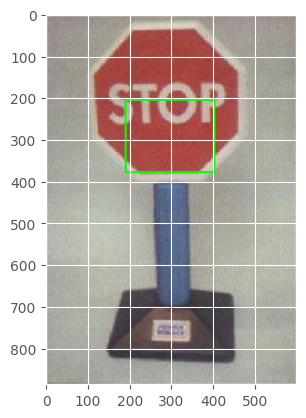

1/1 [==============================] - 0s 19ms/step


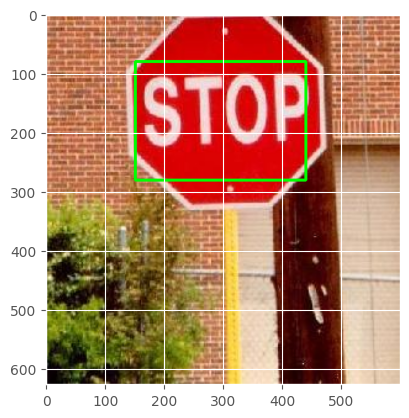

1/1 [==============================] - 0s 18ms/step


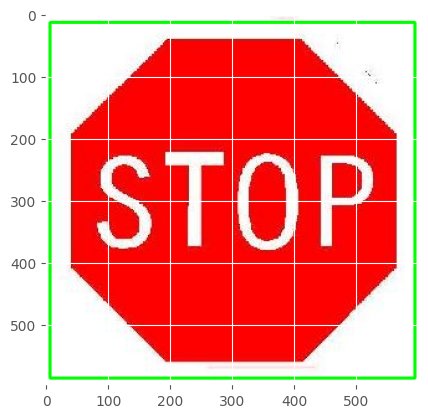

1/1 [==============================] - 0s 18ms/step


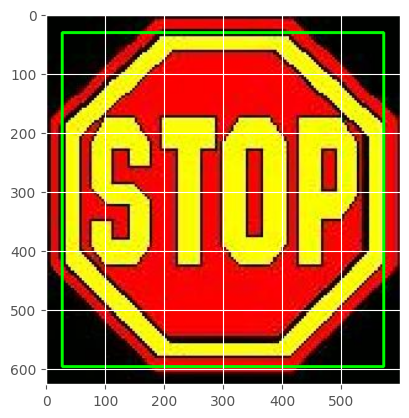

1/1 [==============================] - 0s 19ms/step


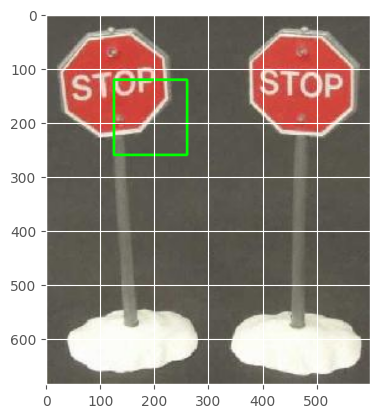

1/1 [==============================] - 0s 19ms/step


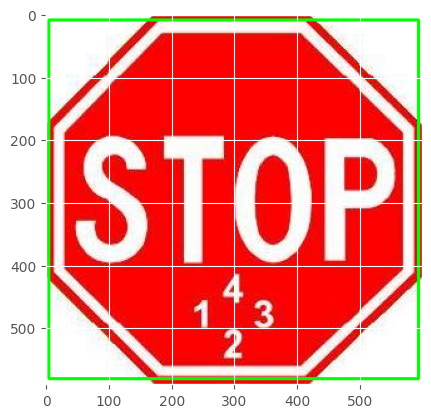

1/1 [==============================] - 0s 25ms/step


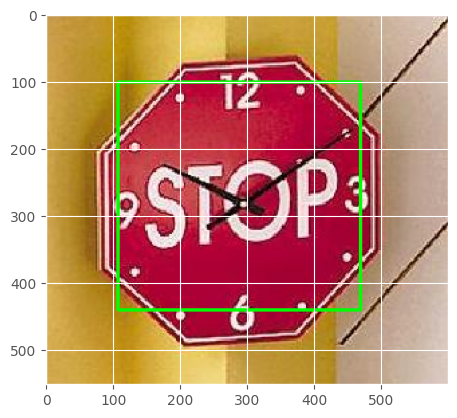

1/1 [==============================] - 0s 18ms/step


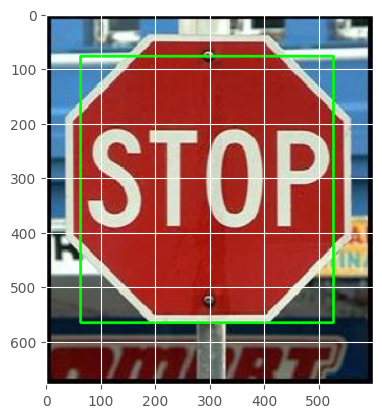

1/1 [==============================] - 0s 24ms/step


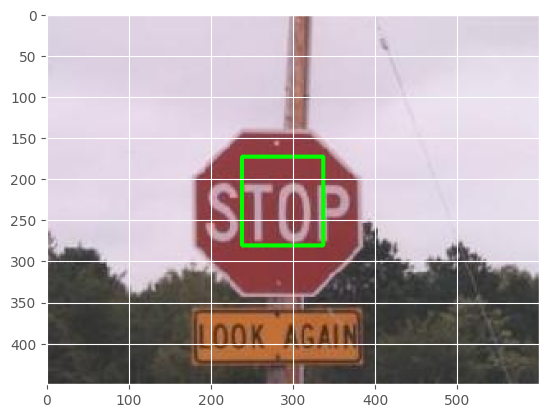

1/1 [==============================] - 0s 20ms/step


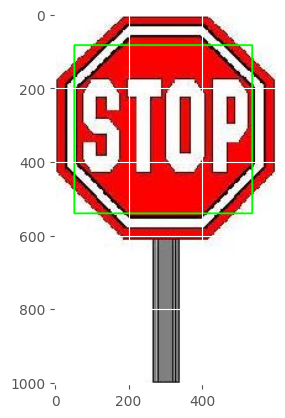

1/1 [==============================] - 0s 18ms/step


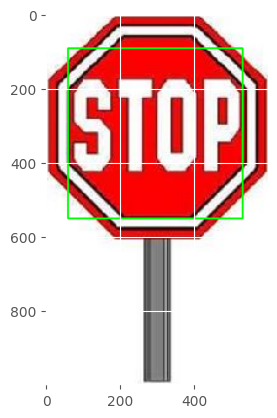

1/1 [==============================] - 0s 19ms/step


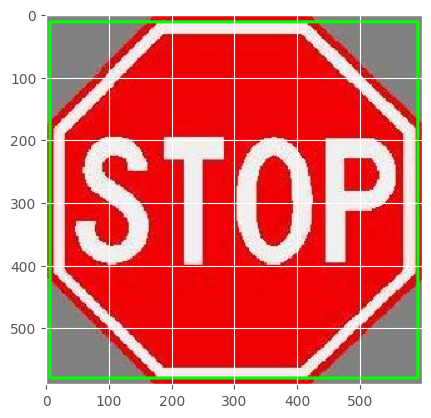

1/1 [==============================] - 0s 18ms/step


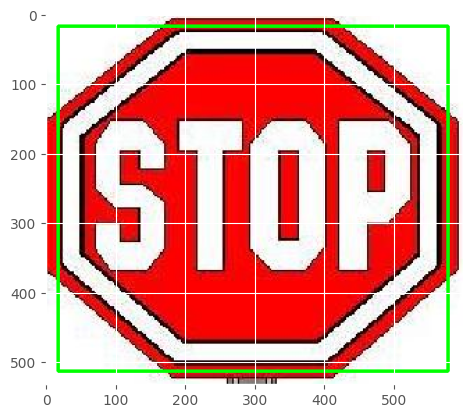

1/1 [==============================] - 0s 20ms/step


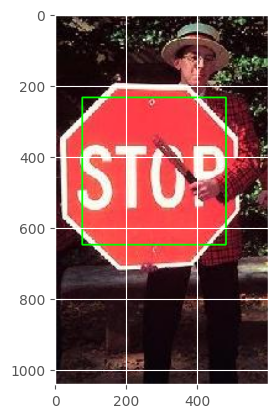

1/1 [==============================] - 0s 19ms/step


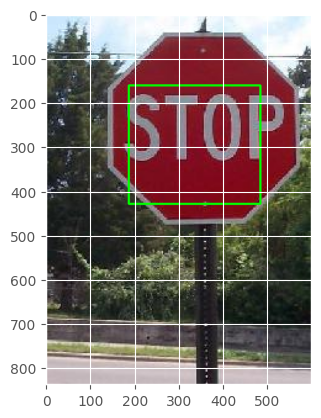

1/1 [==============================] - 0s 21ms/step


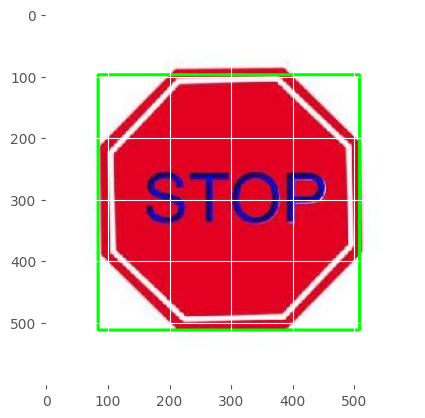

1/1 [==============================] - 0s 19ms/step


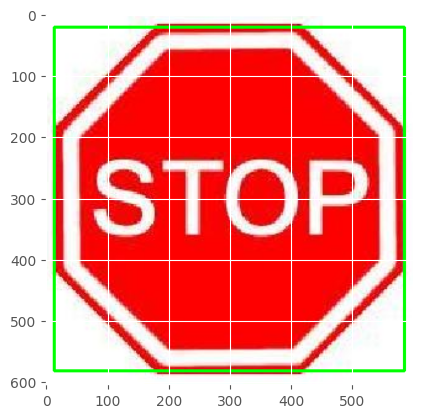

1/1 [==============================] - 0s 20ms/step


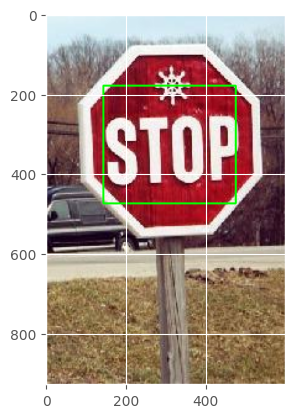

1/1 [==============================] - 0s 20ms/step


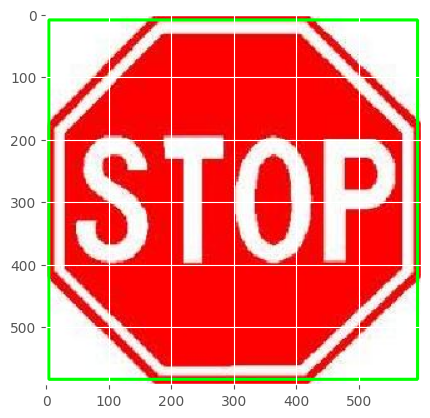

1/1 [==============================] - 0s 18ms/step


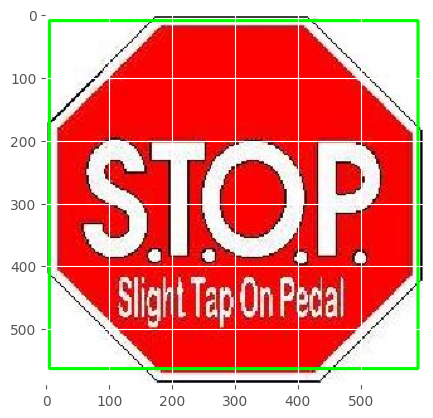

1/1 [==============================] - 0s 17ms/step


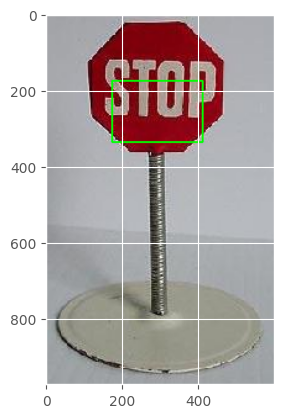

1/1 [==============================] - 0s 21ms/step


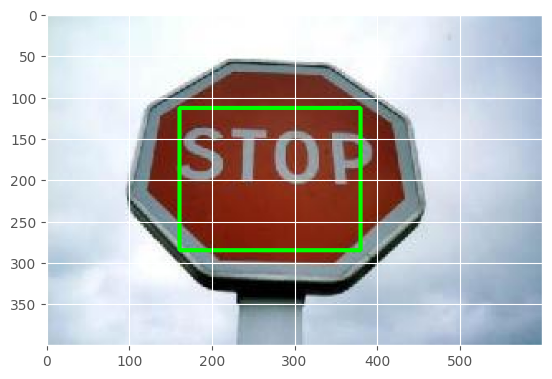

1/1 [==============================] - 0s 24ms/step


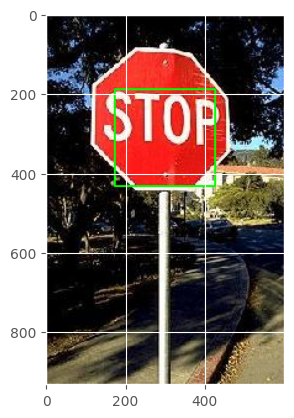

1/1 [==============================] - 0s 18ms/step


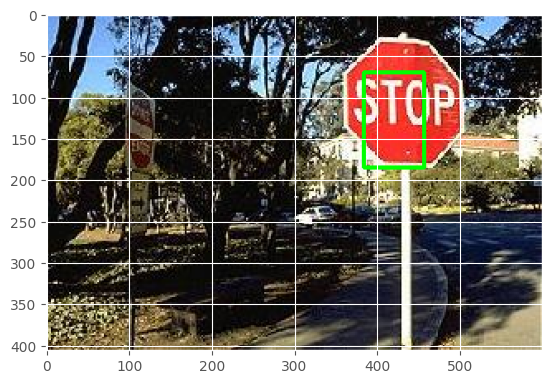

1/1 [==============================] - 0s 19ms/step


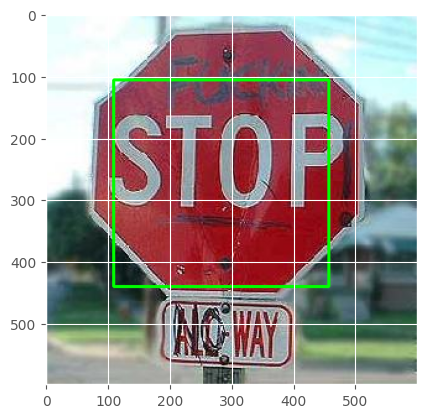

1/1 [==============================] - 0s 19ms/step


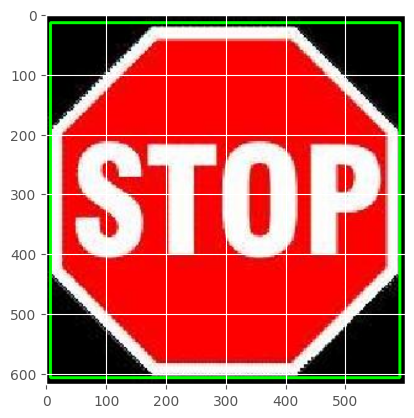

1/1 [==============================] - 0s 21ms/step


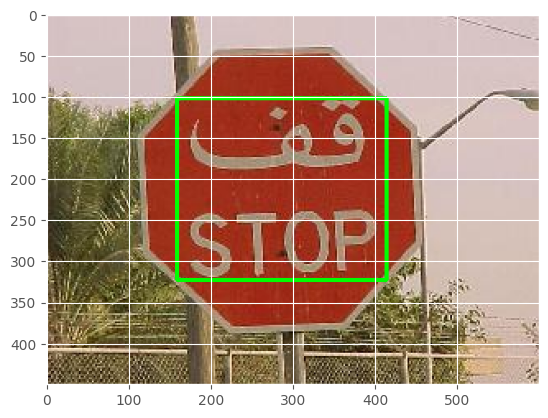

In [19]:
show_predictions(img_paths, model_1)